In [1]:
from mealpy.swarm_based.GWO import OriginalGWO
import pandas as pd
import numpy as np
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
with open("./data/scalller_prices_houses.pkl", "rb") as file:
    x_properties_train, y_properties_train, x_properties_test, y_properties_test = pickle.load(file)

In [3]:
x_properties_train.shape

(1533, 37)

In [4]:
(x_properties_train.shape[1]) / 2

18.5

In [5]:
from sklearn.neural_network import MLPRegressor
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD
from sklearn.metrics import mean_absolute_error
import numpy as np

In [24]:
# def fitness_func(solution):
#     max_iter = int(solution[0])
#     hidden_layer_sizes = (int(solution[1]), int(solution[2]))
#     learning_rate_init = solution[3]
#     momentum = solution[4]

#     regressor_mlp_properties = MLPRegressor(
#         max_iter=max_iter,
#         hidden_layer_sizes=hidden_layer_sizes,
#         activation="logistic",
#         solver="lbfgs",
#         learning_rate_init=learning_rate_init,
#         momentum=momentum
#     )

#     regressor_mlp_properties.fit(x_properties_train, y_properties_train)

#     predictions = regressor_mlp_properties.predict(x_properties_test)
#     result = mean_absolute_error(y_properties_test, predictions)
#     print(result)
#     return result

Usando keras

In [6]:
def fitness_func(solution):
    max_iter = int(solution[0])
    hidden_layer_sizes = (int(solution[1]), int(solution[2]), int(solution[3]))
    learning_rate = solution[4]
    momentum = solution[5]

    model = Sequential()

    # Adicione camadas ocultas com ativação "logística" (sigmoide)
    for hidden_units in hidden_layer_sizes:
        model.add(Dense(units=hidden_units, activation='relu'))

    # Adicione a camada de saída
    model.add(Dense(units=1, activation='relu'))

    # Otimização e aprendizado
    optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    
    model.compile(loss='mse', optimizer=optimizer)

    # Treine o modelo com seus dados de treinamento
    model.fit(x_properties_train, y_properties_train, epochs=max_iter)

    # Faça previsões
    predictions = model.predict(x_properties_test, batch_size=64)
    predictions = np.squeeze(predictions)  # Achatando as previsões

    # Calcule a métrica de erro médio absoluto
    result = mean_absolute_error(y_properties_test, predictions)
    print(result)
    return result if result else 0

In [16]:
problem_dict1 = {
    "fit_func": fitness_func,
    "lb": [100, 19, 19, 19, 0.0001, 0.001],
    "ub": [400, 117, 117, 117, 0.1, 1],
    "minmax": "min",
}

epoch = 500
pop_size = 10
gwo = OriginalGWO(epoch, pop_size)
best_position, best_fitness = gwo.solve(problem_dict1)
print(f"Solution: {best_position}, Fitness: {best_fitness}")

Epoch 1/282
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 2/282
48/48 [==============================] - 0s 908us/step - loss: 0.0196
Epoch 3/282
48/48 [==============================] - 0s 916us/step - loss: 0.0196
Epoch 4/282
48/48 [==============================] - 0s 873us/step - loss: 0.0196
Epoch 5/282
48/48 [==============================] - 0s 916us/step - loss: 0.0196
Epoch 6/282
48/48 [==============================] - 0s 894us/step - loss: 0.0196
Epoch 7/282
48/48 [==============================] - 0s 873us/step - loss: 0.0196
Epoch 8/282
48/48 [==============================] - 0s 873us/step - loss: 0.0196
Epoch 9/282
48/48 [==============================] - 0s 852us/step - loss: 0.0196
Epoch 10/282
48/48 [==============================] - 0s 873us/step - loss: 0.0196
Epoch 11/282
48/48 [==============================] - 0s 894us/step - loss: 0.0196
Epoch 12/282
48/48 [==============================] - 0s 873us/step - loss: 0.0196
Epoch 13/282


2023/10/19 09:37:24 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: Solving single objective optimization problem.


0.11821676753800495
Epoch 1/138
48/48 [==============================] - 0s 934us/step - loss: 0.0196
Epoch 2/138
48/48 [==============================] - 0s 872us/step - loss: 0.0196
Epoch 3/138
48/48 [==============================] - 0s 936us/step - loss: 0.0196
Epoch 4/138
48/48 [==============================] - 0s 904us/step - loss: 0.0196
Epoch 5/138
48/48 [==============================] - 0s 917us/step - loss: 0.0196
Epoch 6/138
48/48 [==============================] - 0s 910us/step - loss: 0.0196
Epoch 7/138
48/48 [==============================] - 0s 923us/step - loss: 0.0196
Epoch 8/138
48/48 [==============================] - 0s 929us/step - loss: 0.0196
Epoch 9/138
48/48 [==============================] - 0s 935us/step - loss: 0.0182
Epoch 10/138
48/48 [==============================] - 0s 853us/step - loss: 0.0080
Epoch 11/138
48/48 [==============================] - 0s 920us/step - loss: 0.0061
Epoch 12/138
48/48 [==============================] - 0s 1ms/step - loss: 0.

2023/10/19 09:40:58 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 1, Current best: 0.03654444488937563, Global best: 0.03654444488937563, Runtime: 111.58147 seconds


Epoch 1/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0063
Epoch 2/400
48/48 [==============================] - 0s 957us/step - loss: 0.0077
Epoch 3/400
48/48 [==============================] - 0s 876us/step - loss: 0.0071
Epoch 4/400
48/48 [==============================] - 0s 862us/step - loss: 0.0074
Epoch 5/400
48/48 [==============================] - 0s 819us/step - loss: 0.0099
Epoch 6/400
48/48 [==============================] - 0s 805us/step - loss: 0.0094
Epoch 7/400
48/48 [==============================] - 0s 817us/step - loss: 0.0086
Epoch 8/400
48/48 [==============================] - 0s 818us/step - loss: 0.0102
Epoch 9/400
48/48 [==============================] - 0s 826us/step - loss: 0.0114
Epoch 10/400
48/48 [==============================] - 0s 859us/step - loss: 0.0129
Epoch 11/400
48/48 [==============================] - 0s 915us/step - loss: 0.0115
Epoch 12/400
48/48 [==============================] - 0s 841us/step - loss: 0.0101
Epoch 13/400
48

2023/10/19 09:43:53 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 2, Current best: 0.03654444488937563, Global best: 0.03654444488937563, Runtime: 174.73524 seconds


Epoch 1/257
48/48 [==============================] - 0s 1ms/step - loss: 0.0063
Epoch 2/257
48/48 [==============================] - 0s 927us/step - loss: 0.0046
Epoch 3/257
48/48 [==============================] - 0s 904us/step - loss: 0.0043
Epoch 4/257
48/48 [==============================] - 0s 917us/step - loss: 0.0042
Epoch 5/257
48/48 [==============================] - 0s 833us/step - loss: 0.0040
Epoch 6/257
48/48 [==============================] - 0s 933us/step - loss: 0.0038
Epoch 7/257
48/48 [==============================] - 0s 911us/step - loss: 0.0037
Epoch 8/257
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 9/257
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 10/257
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 11/257
48/48 [==============================] - 0s 907us/step - loss: 0.0035
Epoch 12/257
48/48 [==============================] - 0s 944us/step - loss: 0.0034
Epoch 13/257
48/48 [=

2023/10/19 09:45:54 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 3, Current best: 0.03654444488937563, Global best: 0.03654444488937563, Runtime: 121.25617 seconds


0.04705060459443977
Epoch 1/306
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/306
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 3/306
48/48 [==============================] - 0s 959us/step - loss: 0.0196
Epoch 4/306
48/48 [==============================] - 0s 959us/step - loss: 0.0196
Epoch 5/306
48/48 [==============================] - 0s 972us/step - loss: 0.0196
Epoch 6/306
48/48 [==============================] - 0s 968us/step - loss: 0.0196
Epoch 7/306
48/48 [==============================] - 0s 982us/step - loss: 0.0196
Epoch 8/306
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 9/306
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 10/306
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 11/306
48/48 [==============================] - 0s 952us/step - loss: 0.0196
Epoch 12/306
48/48 [==============================] - 0s 890us/step - loss: 0.0196
Epo

2023/10/19 09:47:59 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 4, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 124.47335 seconds


0.036224144971223074
Epoch 1/211
48/48 [==============================] - 0s 961us/step - loss: 0.0063
Epoch 2/211
48/48 [==============================] - 0s 924us/step - loss: 0.0050
Epoch 3/211
48/48 [==============================] - 0s 881us/step - loss: 0.0048
Epoch 4/211
48/48 [==============================] - 0s 873us/step - loss: 0.0047
Epoch 5/211
48/48 [==============================] - 0s 913us/step - loss: 0.0046
Epoch 6/211
48/48 [==============================] - 0s 915us/step - loss: 0.0046
Epoch 7/211
48/48 [==============================] - 0s 962us/step - loss: 0.0045
Epoch 8/211
48/48 [==============================] - 0s 956us/step - loss: 0.0045
Epoch 9/211
48/48 [==============================] - 0s 926us/step - loss: 0.0045
Epoch 10/211
48/48 [==============================] - 0s 827us/step - loss: 0.0044
Epoch 11/211
48/48 [==============================] - 0s 907us/step - loss: 0.0044
Epoch 12/211
48/48 [==============================] - 0s 975us/step - loss:

2023/10/19 09:50:25 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 5, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 146.57959 seconds


0.11821676753800495
Epoch 1/159
48/48 [==============================] - 0s 902us/step - loss: 0.0193
Epoch 2/159
48/48 [==============================] - 0s 946us/step - loss: 0.0062
Epoch 3/159
48/48 [==============================] - 0s 942us/step - loss: 0.0055
Epoch 4/159
48/48 [==============================] - 0s 925us/step - loss: 0.0052
Epoch 5/159
48/48 [==============================] - 0s 883us/step - loss: 0.0051
Epoch 6/159
48/48 [==============================] - 0s 928us/step - loss: 0.0051
Epoch 7/159
48/48 [==============================] - 0s 929us/step - loss: 0.0050
Epoch 8/159
48/48 [==============================] - 0s 915us/step - loss: 0.0049
Epoch 9/159
48/48 [==============================] - 0s 914us/step - loss: 0.0049
Epoch 10/159
48/48 [==============================] - 0s 912us/step - loss: 0.0048
Epoch 11/159
48/48 [==============================] - 0s 953us/step - loss: 0.0048
Epoch 12/159
48/48 [==============================] - 0s 931us/step - loss: 

2023/10/19 09:52:35 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 6, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 129.69514 seconds


0.03874054978119626
Epoch 1/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 3/400
48/48 [==============================] - 0s 938us/step - loss: 0.0196
Epoch 4/400
48/48 [==============================] - 0s 907us/step - loss: 0.0196
Epoch 5/400
48/48 [==============================] - 0s 956us/step - loss: 0.0196
Epoch 6/400
48/48 [==============================] - 0s 975us/step - loss: 0.0196
Epoch 7/400
48/48 [==============================] - 0s 954us/step - loss: 0.0196
Epoch 8/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 9/400
48/48 [==============================] - 0s 970us/step - loss: 0.0196
Epoch 10/400
48/48 [==============================] - 0s 907us/step - loss: 0.0196
Epoch 11/400
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 12/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
E

2023/10/19 09:54:52 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 7, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 137.48755 seconds


0.03792155877235148
Epoch 1/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 2/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 3/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 4/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 5/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 6/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 7/400
48/48 [==============================] - 0s 960us/step - loss: 0.0037
Epoch 8/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 9/400
48/48 [==============================] - 0s 978us/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 947us/step - loss: 0.0035
Epoch 11/400
48/48 [==============================] - 0s 933us/step - loss: 0.0034
Epoch 12/400
48/48 [==============================] - 0s 915us/step - loss: 0.0034
Epoch 1

2023/10/19 09:57:19 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 8, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 146.69524 seconds


Epoch 1/358
48/48 [==============================] - 0s 974us/step - loss: 0.0185
Epoch 2/358
48/48 [==============================] - 0s 982us/step - loss: 0.0196
Epoch 3/358
48/48 [==============================] - 0s 988us/step - loss: 0.0196
Epoch 4/358
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 5/358
48/48 [==============================] - 0s 983us/step - loss: 0.0196
Epoch 6/358
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 7/358
48/48 [==============================] - 0s 999us/step - loss: 0.0196
Epoch 8/358
48/48 [==============================] - 0s 931us/step - loss: 0.0196
Epoch 9/358
48/48 [==============================] - 0s 894us/step - loss: 0.0196
Epoch 10/358
48/48 [==============================] - 0s 951us/step - loss: 0.0196
Epoch 11/358
48/48 [==============================] - 0s 929us/step - loss: 0.0196
Epoch 12/358
48/48 [==============================] - 0s 962us/step - loss: 0.0196
Epoch 13/358
48

2023/10/19 10:00:04 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 9, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 165.07999 seconds


0.039033489578307275
Epoch 1/236
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/236
48/48 [==============================] - 0s 964us/step - loss: 0.0196
Epoch 3/236
48/48 [==============================] - 0s 989us/step - loss: 0.0196
Epoch 4/236
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 5/236
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 6/236
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 7/236
48/48 [==============================] - 0s 947us/step - loss: 0.0196
Epoch 8/236
48/48 [==============================] - 0s 895us/step - loss: 0.0196
Epoch 9/236
48/48 [==============================] - 0s 916us/step - loss: 0.0196
Epoch 10/236
48/48 [==============================] - 0s 994us/step - loss: 0.0196
Epoch 11/236
48/48 [==============================] - 0s 969us/step - loss: 0.0196
Epoch 12/236
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Ep

2023/10/19 10:02:52 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 10, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 168.32442 seconds


0.03761585305741971
Epoch 1/400
48/48 [==============================] - 0s 998us/step - loss: 0.0074
Epoch 2/400
48/48 [==============================] - 0s 951us/step - loss: 0.0049
Epoch 3/400
48/48 [==============================] - 0s 960us/step - loss: 0.0047
Epoch 4/400
48/48 [==============================] - 0s 979us/step - loss: 0.0043
Epoch 5/400
48/48 [==============================] - 0s 995us/step - loss: 0.0045
Epoch 6/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 7/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 8/400
48/48 [==============================] - 0s 923us/step - loss: 0.0034
Epoch 9/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 11/400
48/48 [==============================] - 0s 999us/step - loss: 0.0033
Epoch 12/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0034
Epo

2023/10/19 10:05:11 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 11, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 138.72223 seconds


0.03835353913417171
Epoch 1/400
48/48 [==============================] - 0s 985us/step - loss: 0.0196
Epoch 2/400
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 3/400
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 4/400
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 5/400
48/48 [==============================] - 0s 932us/step - loss: 0.0196
Epoch 6/400
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 7/400
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 8/400
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 9/400
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 10/400
48/48 [==============================] - 0s 937us/step - loss: 0.0196
Epoch 11/400
48/48 [==============================] - 0s 958us/step - loss: 0.0196
Epoch 12/400
48/48 [==============================] - 0s 937us/step - loss: 

2023/10/19 10:07:25 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 12, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 133.53991 seconds


Epoch 1/255
48/48 [==============================] - 0s 939us/step - loss: 0.0195
Epoch 2/255
48/48 [==============================] - 0s 897us/step - loss: 0.0138
Epoch 3/255
48/48 [==============================] - 0s 875us/step - loss: 0.0071
Epoch 4/255
48/48 [==============================] - 0s 1ms/step - loss: 0.0062
Epoch 5/255
48/48 [==============================] - 0s 1ms/step - loss: 0.0058
Epoch 6/255
48/48 [==============================] - 0s 983us/step - loss: 0.0054
Epoch 7/255
48/48 [==============================] - 0s 874us/step - loss: 0.0049
Epoch 8/255
48/48 [==============================] - 0s 877us/step - loss: 0.0047
Epoch 9/255
48/48 [==============================] - 0s 897us/step - loss: 0.0046
Epoch 10/255
48/48 [==============================] - 0s 918us/step - loss: 0.0045
Epoch 11/255
48/48 [==============================] - 0s 877us/step - loss: 0.0044
Epoch 12/255
48/48 [==============================] - 0s 897us/step - loss: 0.0043
Epoch 13/255
48/4

2023/10/19 10:09:55 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 13, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 150.09810 seconds


0.11821676753800495
Epoch 1/400
48/48 [==============================] - 0s 984us/step - loss: 0.0141
Epoch 2/400
48/48 [==============================] - 0s 962us/step - loss: 0.0055
Epoch 3/400
48/48 [==============================] - 0s 938us/step - loss: 0.0047
Epoch 4/400
48/48 [==============================] - 0s 833us/step - loss: 0.0043
Epoch 5/400
48/48 [==============================] - 0s 833us/step - loss: 0.0041
Epoch 6/400
48/48 [==============================] - 0s 855us/step - loss: 0.0040
Epoch 7/400
48/48 [==============================] - 0s 874us/step - loss: 0.0038
Epoch 8/400
48/48 [==============================] - 0s 854us/step - loss: 0.0038
Epoch 9/400
48/48 [==============================] - 0s 833us/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 853us/step - loss: 0.0037
Epoch 11/400
48/48 [==============================] - 0s 855us/step - loss: 0.0035
Epoch 12/400
48/48 [==============================] - 0s 834us/step - loss: 

2023/10/19 10:12:13 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 14, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 138.03535 seconds


0.11821676753800495
Epoch 1/219
48/48 [==============================] - 0s 916us/step - loss: 0.0060
Epoch 2/219
48/48 [==============================] - 0s 873us/step - loss: 0.0054
Epoch 3/219
48/48 [==============================] - 0s 831us/step - loss: 0.0051
Epoch 4/219
48/48 [==============================] - 0s 852us/step - loss: 0.0049
Epoch 5/219
48/48 [==============================] - 0s 831us/step - loss: 0.0048
Epoch 6/219
48/48 [==============================] - 0s 852us/step - loss: 0.0046
Epoch 7/219
48/48 [==============================] - 0s 831us/step - loss: 0.0046
Epoch 8/219
48/48 [==============================] - 0s 873us/step - loss: 0.0044
Epoch 9/219
48/48 [==============================] - 0s 809us/step - loss: 0.0044
Epoch 10/219
48/48 [==============================] - 0s 831us/step - loss: 0.0043
Epoch 11/219
48/48 [==============================] - 0s 788us/step - loss: 0.0043
Epoch 12/219
48/48 [==============================] - 0s 873us/step - loss: 

2023/10/19 10:14:33 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 15, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 139.87882 seconds


0.03682407401376806
Epoch 1/285
48/48 [==============================] - 0s 934us/step - loss: 0.0068
Epoch 2/285
48/48 [==============================] - 0s 924us/step - loss: 0.0045
Epoch 3/285
48/48 [==============================] - 0s 917us/step - loss: 0.0040
Epoch 4/285
48/48 [==============================] - 0s 899us/step - loss: 0.0038
Epoch 5/285
48/48 [==============================] - 0s 919us/step - loss: 0.0035
Epoch 6/285
48/48 [==============================] - 0s 897us/step - loss: 0.0036
Epoch 7/285
48/48 [==============================] - 0s 892us/step - loss: 0.0034
Epoch 8/285
48/48 [==============================] - 0s 918us/step - loss: 0.0036
Epoch 9/285
48/48 [==============================] - 0s 918us/step - loss: 0.0034
Epoch 10/285
48/48 [==============================] - 0s 897us/step - loss: 0.0035
Epoch 11/285
48/48 [==============================] - 0s 897us/step - loss: 0.0039
Epoch 12/285
48/48 [==============================] - 0s 898us/step - loss: 

2023/10/19 10:17:16 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 16, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 163.12030 seconds


0.038564150175186544
Epoch 1/292
48/48 [==============================] - 0s 1ms/step - loss: 0.0070
Epoch 2/292
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 3/292
48/48 [==============================] - 0s 962us/step - loss: 0.0043
Epoch 4/292
48/48 [==============================] - 0s 984us/step - loss: 0.0041
Epoch 5/292
48/48 [==============================] - 0s 982us/step - loss: 0.0040
Epoch 6/292
48/48 [==============================] - 0s 960us/step - loss: 0.0039
Epoch 7/292
48/48 [==============================] - 0s 897us/step - loss: 0.0038
Epoch 8/292
48/48 [==============================] - 0s 896us/step - loss: 0.0038
Epoch 9/292
48/48 [==============================] - 0s 895us/step - loss: 0.0037
Epoch 10/292
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 11/292
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 12/292
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Ep

2023/10/19 10:19:26 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 17, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 130.02001 seconds


0.03944102887985102
Epoch 1/369
48/48 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 2/369
48/48 [==============================] - 0s 982us/step - loss: 0.0053
Epoch 3/369
48/48 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 4/369
48/48 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 5/369
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 6/369
48/48 [==============================] - 0s 962us/step - loss: 0.0047
Epoch 7/369
48/48 [==============================] - 0s 919us/step - loss: 0.0045
Epoch 8/369
48/48 [==============================] - 0s 919us/step - loss: 0.0045
Epoch 9/369
48/48 [==============================] - 0s 939us/step - loss: 0.0044
Epoch 10/369
48/48 [==============================] - 0s 940us/step - loss: 0.0043
Epoch 11/369
48/48 [==============================] - 0s 939us/step - loss: 0.0042
Epoch 12/369
48/48 [==============================] - 0s 938us/step - loss: 0.0042
E

2023/10/19 10:22:08 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 18, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 161.99866 seconds


Epoch 1/400
48/48 [==============================] - 0s 876us/step - loss: 0.0196
Epoch 2/400
48/48 [==============================] - 0s 876us/step - loss: 0.0196
Epoch 3/400
48/48 [==============================] - 0s 874us/step - loss: 0.0196
Epoch 4/400
48/48 [==============================] - 0s 854us/step - loss: 0.0196
Epoch 5/400
48/48 [==============================] - 0s 834us/step - loss: 0.0196
Epoch 6/400
48/48 [==============================] - 0s 838us/step - loss: 0.0196
Epoch 7/400
48/48 [==============================] - 0s 834us/step - loss: 0.0196
Epoch 8/400
48/48 [==============================] - 0s 854us/step - loss: 0.0196
Epoch 9/400
48/48 [==============================] - 0s 856us/step - loss: 0.0196
Epoch 10/400
48/48 [==============================] - 0s 833us/step - loss: 0.0196
Epoch 11/400
48/48 [==============================] - 0s 851us/step - loss: 0.0196
Epoch 12/400
48/48 [==============================] - 0s 833us/step - loss: 0.0196
Epoch 13/400


2023/10/19 10:44:27 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 19, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 1339.73429 seconds


0.03695775804627321
Epoch 1/400
48/48 [==============================] - 0s 925us/step - loss: 0.0058
Epoch 2/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 3/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 4/400
48/48 [==============================] - 0s 989us/step - loss: 0.0043
Epoch 5/400
48/48 [==============================] - 0s 967us/step - loss: 0.0040
Epoch 6/400
48/48 [==============================] - 0s 888us/step - loss: 0.0039
Epoch 7/400
48/48 [==============================] - 0s 890us/step - loss: 0.0040
Epoch 8/400
48/48 [==============================] - 0s 904us/step - loss: 0.0037
Epoch 9/400
48/48 [==============================] - 0s 944us/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 908us/step - loss: 0.0036
Epoch 11/400
48/48 [==============================] - 0s 907us/step - loss: 0.0036
Epoch 12/400
48/48 [==============================] - 0s 942us/step - loss: 0.00

2023/10/19 10:46:37 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 20, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 129.86705 seconds


Epoch 1/193
48/48 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 2/193
48/48 [==============================] - 0s 952us/step - loss: 0.0054
Epoch 3/193
48/48 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 4/193
48/48 [==============================] - 0s 949us/step - loss: 0.0050
Epoch 5/193
48/48 [==============================] - 0s 866us/step - loss: 0.0050
Epoch 6/193
48/48 [==============================] - 0s 820us/step - loss: 0.0049
Epoch 7/193
48/48 [==============================] - 0s 858us/step - loss: 0.0049
Epoch 8/193
48/48 [==============================] - 0s 831us/step - loss: 0.0048
Epoch 9/193
48/48 [==============================] - 0s 841us/step - loss: 0.0048
Epoch 10/193
48/48 [==============================] - 0s 815us/step - loss: 0.0047
Epoch 11/193
48/48 [==============================] - 0s 802us/step - loss: 0.0047
Epoch 12/193
48/48 [==============================] - 0s 822us/step - loss: 0.0047
Epoch 13/193
48/4

2023/10/19 10:48:51 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 21, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 133.37183 seconds


0.03786121481571532
Epoch 1/400
48/48 [==============================] - 0s 891us/step - loss: 0.0093
Epoch 2/400
48/48 [==============================] - 0s 876us/step - loss: 0.0078
Epoch 3/400
48/48 [==============================] - 0s 783us/step - loss: 0.0073
Epoch 4/400
48/48 [==============================] - 0s 888us/step - loss: 0.0070
Epoch 5/400
48/48 [==============================] - 0s 860us/step - loss: 0.0067
Epoch 6/400
48/48 [==============================] - 0s 804us/step - loss: 0.0065
Epoch 7/400
48/48 [==============================] - 0s 783us/step - loss: 0.0064
Epoch 8/400
48/48 [==============================] - 0s 786us/step - loss: 0.0062
Epoch 9/400
48/48 [==============================] - 0s 800us/step - loss: 0.0061
Epoch 10/400
48/48 [==============================] - 0s 783us/step - loss: 0.0060
Epoch 11/400
48/48 [==============================] - 0s 819us/step - loss: 0.0059
Epoch 12/400
48/48 [==============================] - 0s 880us/step - loss: 

2023/10/19 10:51:02 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 22, Current best: 0.036224144971223074, Global best: 0.036224144971223074, Runtime: 131.84382 seconds


Epoch 1/346
48/48 [==============================] - 0s 872us/step - loss: 0.0059
Epoch 2/346
48/48 [==============================] - 0s 886us/step - loss: 0.0045
Epoch 3/346
48/48 [==============================] - 0s 911us/step - loss: 0.0037
Epoch 4/346
48/48 [==============================] - 0s 985us/step - loss: 0.0040
Epoch 5/346
48/48 [==============================] - 0s 879us/step - loss: 0.0035
Epoch 6/346
48/48 [==============================] - 0s 854us/step - loss: 0.0036
Epoch 7/346
48/48 [==============================] - 0s 899us/step - loss: 0.0042
Epoch 8/346
48/48 [==============================] - 0s 871us/step - loss: 0.0038
Epoch 9/346
48/48 [==============================] - 0s 830us/step - loss: 0.0033
Epoch 10/346
48/48 [==============================] - 0s 793us/step - loss: 0.0037
Epoch 11/346
48/48 [==============================] - 0s 885us/step - loss: 0.0035
Epoch 12/346
48/48 [==============================] - 0s 878us/step - loss: 0.0030
Epoch 13/346


2023/10/19 10:53:27 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 23, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 144.30202 seconds


0.03620456136223359
Epoch 1/260
48/48 [==============================] - 0s 866us/step - loss: 0.0092
Epoch 2/260
48/48 [==============================] - 0s 845us/step - loss: 0.0056
Epoch 3/260
48/48 [==============================] - 0s 877us/step - loss: 0.0052
Epoch 4/260
48/48 [==============================] - 0s 985us/step - loss: 0.0051
Epoch 5/260
48/48 [==============================] - 0s 865us/step - loss: 0.0049
Epoch 6/260
48/48 [==============================] - 0s 895us/step - loss: 0.0049
Epoch 7/260
48/48 [==============================] - 0s 904us/step - loss: 0.0048
Epoch 8/260
48/48 [==============================] - 0s 815us/step - loss: 0.0047
Epoch 9/260
48/48 [==============================] - 0s 894us/step - loss: 0.0046
Epoch 10/260
48/48 [==============================] - 0s 865us/step - loss: 0.0046
Epoch 11/260
48/48 [==============================] - 0s 839us/step - loss: 0.0045
Epoch 12/260
48/48 [==============================] - 0s 784us/step - loss: 

2023/10/19 10:55:35 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 24, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 127.92941 seconds


0.041047470099861406
Epoch 1/400
48/48 [==============================] - 0s 860us/step - loss: 0.0060
Epoch 2/400
48/48 [==============================] - 0s 900us/step - loss: 0.0052
Epoch 3/400
48/48 [==============================] - 0s 756us/step - loss: 0.0049
Epoch 4/400
48/48 [==============================] - 0s 823us/step - loss: 0.0047
Epoch 5/400
48/48 [==============================] - 0s 802us/step - loss: 0.0045
Epoch 6/400
48/48 [==============================] - 0s 808us/step - loss: 0.0044
Epoch 7/400
48/48 [==============================] - 0s 812us/step - loss: 0.0043
Epoch 8/400
48/48 [==============================] - 0s 825us/step - loss: 0.0042
Epoch 9/400
48/48 [==============================] - 0s 794us/step - loss: 0.0041
Epoch 10/400
48/48 [==============================] - 0s 804us/step - loss: 0.0040
Epoch 11/400
48/48 [==============================] - 0s 786us/step - loss: 0.0040
Epoch 12/400
48/48 [==============================] - 0s 810us/step - loss:

2023/10/19 10:57:47 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 25, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 131.90089 seconds


0.040365269390023925
Epoch 1/100
48/48 [==============================] - 0s 851us/step - loss: 0.0089
Epoch 2/100
48/48 [==============================] - 0s 851us/step - loss: 0.0054
Epoch 3/100
48/48 [==============================] - 0s 851us/step - loss: 0.0051
Epoch 4/100
48/48 [==============================] - 0s 851us/step - loss: 0.0050
Epoch 5/100
48/48 [==============================] - 0s 853us/step - loss: 0.0048
Epoch 6/100
48/48 [==============================] - 0s 851us/step - loss: 0.0047
Epoch 7/100
48/48 [==============================] - 0s 851us/step - loss: 0.0046
Epoch 8/100
48/48 [==============================] - 0s 855us/step - loss: 0.0045
Epoch 9/100
48/48 [==============================] - 0s 851us/step - loss: 0.0044
Epoch 10/100
48/48 [==============================] - 0s 851us/step - loss: 0.0044
Epoch 11/100
48/48 [==============================] - 0s 814us/step - loss: 0.0043
Epoch 12/100
48/48 [==============================] - 0s 851us/step - loss:

2023/10/19 11:00:02 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 26, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 135.01992 seconds


Epoch 1/124
48/48 [==============================] - 0s 971us/step - loss: 0.0106
Epoch 2/124
48/48 [==============================] - 0s 987us/step - loss: 0.0124
Epoch 3/124
48/48 [==============================] - 0s 966us/step - loss: 0.0109
Epoch 4/124
48/48 [==============================] - 0s 936us/step - loss: 0.0096
Epoch 5/124
48/48 [==============================] - 0s 851us/step - loss: 0.0143
Epoch 6/124
48/48 [==============================] - 0s 919us/step - loss: 0.0196
Epoch 7/124
48/48 [==============================] - 0s 936us/step - loss: 0.0196
Epoch 8/124
48/48 [==============================] - 0s 851us/step - loss: 0.0196
Epoch 9/124
48/48 [==============================] - 0s 936us/step - loss: 0.0196
Epoch 10/124
48/48 [==============================] - 0s 851us/step - loss: 0.0196
Epoch 11/124
48/48 [==============================] - 0s 931us/step - loss: 0.0196
Epoch 12/124
48/48 [==============================] - 0s 923us/step - loss: 0.0196
Epoch 13/124


2023/10/19 11:02:05 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 27, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 123.28055 seconds


0.04235573838839772
Epoch 1/100
48/48 [==============================] - 0s 980us/step - loss: 0.0060
Epoch 2/100
48/48 [==============================] - 0s 937us/step - loss: 0.0051
Epoch 3/100
48/48 [==============================] - 0s 916us/step - loss: 0.0049
Epoch 4/100
48/48 [==============================] - 0s 916us/step - loss: 0.0050
Epoch 5/100
48/48 [==============================] - 0s 916us/step - loss: 0.0046
Epoch 6/100
48/48 [==============================] - 0s 916us/step - loss: 0.0046
Epoch 7/100
48/48 [==============================] - 0s 831us/step - loss: 0.0043
Epoch 8/100
48/48 [==============================] - 0s 852us/step - loss: 0.0043
Epoch 9/100
48/48 [==============================] - 0s 873us/step - loss: 0.0042
Epoch 10/100
48/48 [==============================] - 0s 852us/step - loss: 0.0041
Epoch 11/100
48/48 [==============================] - 0s 852us/step - loss: 0.0041
Epoch 12/100
48/48 [==============================] - 0s 852us/step - loss: 

2023/10/19 11:04:12 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 28, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 127.43139 seconds


0.0382797901842568
Epoch 1/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0070
Epoch 2/100
48/48 [==============================] - 0s 936us/step - loss: 0.0064
Epoch 3/100
48/48 [==============================] - 0s 936us/step - loss: 0.0052
Epoch 4/100
48/48 [==============================] - 0s 936us/step - loss: 0.0040
Epoch 5/100
48/48 [==============================] - 0s 936us/step - loss: 0.0051
Epoch 6/100
48/48 [==============================] - 0s 936us/step - loss: 0.0061
Epoch 7/100
48/48 [==============================] - 0s 851us/step - loss: 0.0083
Epoch 8/100
48/48 [==============================] - 0s 849us/step - loss: 0.0089
Epoch 9/100
48/48 [==============================] - 0s 851us/step - loss: 0.0087
Epoch 10/100
48/48 [==============================] - 0s 846us/step - loss: 0.0119
Epoch 11/100
48/48 [==============================] - 0s 851us/step - loss: 0.0195
Epoch 12/100
48/48 [==============================] - 0s 851us/step - loss: 0.0

2023/10/19 11:06:50 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 29, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 157.37582 seconds


0.11821676753800495
Epoch 1/316
48/48 [==============================] - 0s 907us/step - loss: 0.0113
Epoch 2/316
48/48 [==============================] - 0s 879us/step - loss: 0.0080
Epoch 3/316
48/48 [==============================] - 0s 816us/step - loss: 0.0060
Epoch 4/316
48/48 [==============================] - 0s 860us/step - loss: 0.0055
Epoch 5/316
48/48 [==============================] - 0s 899us/step - loss: 0.0061
Epoch 6/316
48/48 [==============================] - 0s 841us/step - loss: 0.0088
Epoch 7/316
48/48 [==============================] - 0s 883us/step - loss: 0.0095
Epoch 8/316
48/48 [==============================] - 0s 815us/step - loss: 0.0089
Epoch 9/316
48/48 [==============================] - 0s 885us/step - loss: 0.0110
Epoch 10/316
48/48 [==============================] - 0s 896us/step - loss: 0.0182
Epoch 11/316
48/48 [==============================] - 0s 832us/step - loss: 0.0196
Epoch 12/316
48/48 [==============================] - 0s 796us/step - loss: 

2023/10/19 11:09:29 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 30, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 159.51381 seconds


0.04375335440540019
Epoch 1/146
48/48 [==============================] - 0s 1ms/step - loss: 0.0137
Epoch 2/146
48/48 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 3/146
48/48 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 4/146
48/48 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 5/146
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 6/146
48/48 [==============================] - 0s 928us/step - loss: 0.0046
Epoch 7/146
48/48 [==============================] - 0s 917us/step - loss: 0.0045
Epoch 8/146
48/48 [==============================] - 0s 921us/step - loss: 0.0044
Epoch 9/146
48/48 [==============================] - 0s 916us/step - loss: 0.0044
Epoch 10/146
48/48 [==============================] - 0s 963us/step - loss: 0.0043
Epoch 11/146
48/48 [==============================] - 0s 992us/step - loss: 0.0043
Epoch 12/146
48/48 [==============================] - 0s 919us/step - loss: 0.0042
Epo

2023/10/19 11:12:07 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 31, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 157.71244 seconds


0.03953259406372577
Epoch 1/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0075
Epoch 2/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 3/100
48/48 [==============================] - 0s 945us/step - loss: 0.0052
Epoch 4/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 5/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 6/100
48/48 [==============================] - 0s 955us/step - loss: 0.0046
Epoch 7/100
48/48 [==============================] - 0s 965us/step - loss: 0.0045
Epoch 8/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 9/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 10/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 11/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 12/100
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 13/10

2023/10/19 11:14:49 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 32, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 161.66293 seconds


0.11821676753800495
Epoch 1/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 2/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 3/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 4/330
48/48 [==============================] - 0s 981us/step - loss: 0.0048
Epoch 5/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 6/330
48/48 [==============================] - 0s 959us/step - loss: 0.0047
Epoch 7/330
48/48 [==============================] - 0s 942us/step - loss: 0.0045
Epoch 8/330
48/48 [==============================] - 0s 948us/step - loss: 0.0044
Epoch 9/330
48/48 [==============================] - 0s 940us/step - loss: 0.0044
Epoch 10/330
48/48 [==============================] - 0s 986us/step - loss: 0.0043
Epoch 11/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 12/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch

2023/10/19 11:17:18 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 33, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 149.33540 seconds


0.04123118642682767
Epoch 1/273
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/273
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 3/273
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 4/273
48/48 [==============================] - 0s 971us/step - loss: 0.0196
Epoch 5/273
48/48 [==============================] - 0s 986us/step - loss: 0.0196
Epoch 6/273
48/48 [==============================] - 0s 978us/step - loss: 0.0196
Epoch 7/273
48/48 [==============================] - 0s 927us/step - loss: 0.0196
Epoch 8/273
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 9/273
48/48 [==============================] - 0s 985us/step - loss: 0.0196
Epoch 10/273
48/48 [==============================] - 0s 924us/step - loss: 0.0196
Epoch 11/273
48/48 [==============================] - 0s 955us/step - loss: 0.0196
Epoch 12/273
48/48 [==============================] - 0s 976us/step - loss: 0.0196
E

2023/10/19 11:19:42 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 34, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 143.93565 seconds


0.036236261061930834
Epoch 1/263
48/48 [==============================] - 0s 1ms/step - loss: 0.0072
Epoch 2/263
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 3/263
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 4/263
48/48 [==============================] - 0s 923us/step - loss: 0.0038
Epoch 5/263
48/48 [==============================] - 0s 958us/step - loss: 0.0038
Epoch 6/263
48/48 [==============================] - 0s 944us/step - loss: 0.0036
Epoch 7/263
48/48 [==============================] - 0s 951us/step - loss: 0.0035
Epoch 8/263
48/48 [==============================] - 0s 952us/step - loss: 0.0036
Epoch 9/263
48/48 [==============================] - 0s 957us/step - loss: 0.0034
Epoch 10/263
48/48 [==============================] - 0s 1000us/step - loss: 0.0034
Epoch 11/263
48/48 [==============================] - 0s 998us/step - loss: 0.0037
Epoch 12/263
48/48 [==============================] - 0s 1ms/step - loss: 0.0035

2023/10/19 11:22:33 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 35, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 170.89907 seconds


0.036285305434875764
Epoch 1/322
48/48 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 2/322
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 3/322
48/48 [==============================] - 0s 974us/step - loss: 0.0043
Epoch 4/322
48/48 [==============================] - 0s 974us/step - loss: 0.0041
Epoch 5/322
48/48 [==============================] - 0s 980us/step - loss: 0.0040
Epoch 6/322
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 7/322
48/48 [==============================] - 0s 960us/step - loss: 0.0040
Epoch 8/322
48/48 [==============================] - 0s 978us/step - loss: 0.0039
Epoch 9/322
48/48 [==============================] - 0s 947us/step - loss: 0.0038
Epoch 10/322
48/48 [==============================] - 0s 958us/step - loss: 0.0037
Epoch 11/322
48/48 [==============================] - 0s 948us/step - loss: 0.0037
Epoch 12/322
48/48 [==============================] - 0s 960us/step - loss: 0.003

2023/10/19 11:25:15 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 36, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 162.05550 seconds


0.11821676753800495
Epoch 1/264
48/48 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 2/264
48/48 [==============================] - 0s 933us/step - loss: 0.0051
Epoch 3/264
48/48 [==============================] - 0s 948us/step - loss: 0.0047
Epoch 4/264
48/48 [==============================] - 0s 975us/step - loss: 0.0045
Epoch 5/264
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 6/264
48/48 [==============================] - 0s 999us/step - loss: 0.0041
Epoch 7/264
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 8/264
48/48 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 9/264
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 10/264
48/48 [==============================] - 0s 958us/step - loss: 0.0037
Epoch 11/264
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 12/264
48/48 [==============================] - 0s 993us/step - loss: 0.0035
Epo

2023/10/19 11:27:49 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 37, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 154.45211 seconds


0.03895799752134794
Epoch 1/330
48/48 [==============================] - 0s 984us/step - loss: 0.0057
Epoch 2/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 3/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 4/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 5/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 6/330
48/48 [==============================] - 0s 988us/step - loss: 0.0040
Epoch 7/330
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 8/330
48/48 [==============================] - 0s 995us/step - loss: 0.0038
Epoch 9/330
48/48 [==============================] - 0s 982us/step - loss: 0.0037
Epoch 10/330
48/48 [==============================] - 0s 958us/step - loss: 0.0037
Epoch 11/330
48/48 [==============================] - 0s 918us/step - loss: 0.0036
Epoch 12/330
48/48 [==============================] - 0s 990us/step - loss: 0.0035
Epo

2023/10/19 11:30:35 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 38, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 165.30040 seconds


0.04031901538306936
Epoch 1/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0095
Epoch 2/400
48/48 [==============================] - 0s 978us/step - loss: 0.0072
Epoch 3/400
48/48 [==============================] - 0s 983us/step - loss: 0.0088
Epoch 4/400
48/48 [==============================] - 0s 999us/step - loss: 0.0081
Epoch 5/400
48/48 [==============================] - 0s 996us/step - loss: 0.0094
Epoch 6/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0102
Epoch 7/400
48/48 [==============================] - 0s 977us/step - loss: 0.0090
Epoch 8/400
48/48 [==============================] - 0s 939us/step - loss: 0.0078
Epoch 9/400
48/48 [==============================] - 0s 924us/step - loss: 0.0075
Epoch 10/400
48/48 [==============================] - 0s 965us/step - loss: 0.0088
Epoch 11/400
48/48 [==============================] - 0s 981us/step - loss: 0.0096
Epoch 12/400
48/48 [==============================] - 0s 955us/step - loss: 0.01

2023/10/19 11:33:19 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 39, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 164.65939 seconds


Epoch 1/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0073
Epoch 2/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 3/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 4/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 5/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 6/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 7/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 8/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 9/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 10/262
48/48 [==============================] - 0s 979us/step - loss: 0.0037
Epoch 11/262
48/48 [==============================] - 0s 981us/step - loss: 0.0036
Epoch 12/262
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 13/262
48/48 [=============

2023/10/19 11:35:56 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 40, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 156.88838 seconds


0.11821676753800495
Epoch 1/260
48/48 [==============================] - 0s 978us/step - loss: 0.0061
Epoch 2/260
48/48 [==============================] - 0s 946us/step - loss: 0.0050
Epoch 3/260
48/48 [==============================] - 0s 904us/step - loss: 0.0047
Epoch 4/260
48/48 [==============================] - 0s 956us/step - loss: 0.0044
Epoch 5/260
48/48 [==============================] - 0s 993us/step - loss: 0.0043
Epoch 6/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 7/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 8/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 9/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 10/260
48/48 [==============================] - 0s 936us/step - loss: 0.0037
Epoch 11/260
48/48 [==============================] - 0s 992us/step - loss: 0.0036
Epoch 12/260
48/48 [==============================] - 0s 888us/step - loss: 0.0036
E

2023/10/19 11:38:33 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 41, Current best: 0.03620456136223359, Global best: 0.03620456136223359, Runtime: 157.12395 seconds



Epoch 1/251
48/48 [==============================] - 0s 1ms/step - loss: 0.0110
Epoch 2/251
48/48 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 3/251
48/48 [==============================] - 0s 1ms/step - loss: 0.0087
Epoch 4/251
48/48 [==============================] - 0s 1ms/step - loss: 0.0087
Epoch 5/251
48/48 [==============================] - 0s 984us/step - loss: 0.0073
Epoch 6/251
48/48 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 7/251
48/48 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 8/251
48/48 [==============================] - 0s 979us/step - loss: 0.0063
Epoch 9/251
48/48 [==============================] - 0s 954us/step - loss: 0.0088
Epoch 10/251
48/48 [==============================] - 0s 981us/step - loss: 0.0165
Epoch 11/251
48/48 [==============================] - 0s 951us/step - loss: 0.0196
Epoch 12/251
48/48 [==============================] - 0s 955us/step - loss: 0.0196
Epoch 13/251
48/48 [====

2023/10/19 11:41:29 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 42, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 176.02934 seconds


0.04015000841286188
Epoch 1/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 2/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 3/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 4/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 5/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 6/260
48/48 [==============================] - 0s 953us/step - loss: 0.0043
Epoch 7/260
48/48 [==============================] - 0s 985us/step - loss: 0.0042
Epoch 8/260
48/48 [==============================] - 0s 955us/step - loss: 0.0042
Epoch 9/260
48/48 [==============================] - 0s 869us/step - loss: 0.0040
Epoch 10/260
48/48 [==============================] - 0s 880us/step - loss: 0.0040
Epoch 11/260
48/48 [==============================] - 0s 886us/step - loss: 0.0039
Epoch 12/260
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch

2023/10/19 11:44:09 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 43, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 159.96655 seconds


0.037277934757949584
Epoch 1/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 2/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 3/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 4/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 5/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 6/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 7/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 8/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 9/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 10/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 11/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 12/305
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 13/305
48/

2023/10/19 11:47:04 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 44, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 175.09741 seconds


0.03964815508876093
Epoch 1/400
48/48 [==============================] - 0s 943us/step - loss: 0.0058
Epoch 2/400
48/48 [==============================] - 0s 940us/step - loss: 0.0045
Epoch 3/400
48/48 [==============================] - 0s 924us/step - loss: 0.0043
Epoch 4/400
48/48 [==============================] - 0s 949us/step - loss: 0.0040
Epoch 5/400
48/48 [==============================] - 0s 924us/step - loss: 0.0039
Epoch 6/400
48/48 [==============================] - 0s 905us/step - loss: 0.0037
Epoch 7/400
48/48 [==============================] - 0s 901us/step - loss: 0.0036
Epoch 8/400
48/48 [==============================] - 0s 901us/step - loss: 0.0036
Epoch 9/400
48/48 [==============================] - 0s 874us/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 922us/step - loss: 0.0034
Epoch 11/400
48/48 [==============================] - 0s 908us/step - loss: 0.0035
Epoch 12/400
48/48 [==============================] - 0s 874us/step - loss: 

2023/10/19 11:49:55 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 45, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 170.18319 seconds


0.11821676753800495
Epoch 1/254
48/48 [==============================] - 0s 904us/step - loss: 0.0056
Epoch 2/254
48/48 [==============================] - 0s 869us/step - loss: 0.0047
Epoch 3/254
48/48 [==============================] - 0s 853us/step - loss: 0.0043
Epoch 4/254
48/48 [==============================] - 0s 855us/step - loss: 0.0041
Epoch 5/254
48/48 [==============================] - 0s 844us/step - loss: 0.0039
Epoch 6/254
48/48 [==============================] - 0s 841us/step - loss: 0.0039
Epoch 7/254
48/48 [==============================] - 0s 889us/step - loss: 0.0038
Epoch 8/254
48/48 [==============================] - 0s 834us/step - loss: 0.0036
Epoch 9/254
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 10/254
48/48 [==============================] - 0s 968us/step - loss: 0.0035
Epoch 11/254
48/48 [==============================] - 0s 922us/step - loss: 0.0035
Epoch 12/254
48/48 [==============================] - 0s 892us/step - loss: 0.

2023/10/19 11:51:39 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 46, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 104.56441 seconds


0.03931918695233547
Epoch 1/271
48/48 [==============================] - 0s 1ms/step - loss: 0.0073
Epoch 2/271
48/48 [==============================] - 0s 987us/step - loss: 0.0051
Epoch 3/271
48/48 [==============================] - 0s 955us/step - loss: 0.0048
Epoch 4/271
48/48 [==============================] - 0s 915us/step - loss: 0.0047
Epoch 5/271
48/48 [==============================] - 0s 909us/step - loss: 0.0045
Epoch 6/271
48/48 [==============================] - 0s 917us/step - loss: 0.0044
Epoch 7/271
48/48 [==============================] - 0s 952us/step - loss: 0.0042
Epoch 8/271
48/48 [==============================] - 0s 972us/step - loss: 0.0041
Epoch 9/271
48/48 [==============================] - 0s 893us/step - loss: 0.0041
Epoch 10/271
48/48 [==============================] - 0s 846us/step - loss: 0.0040
Epoch 11/271
48/48 [==============================] - 0s 905us/step - loss: 0.0039
Epoch 12/271
48/48 [==============================] - 0s 937us/step - loss: 0.

2023/10/19 11:53:38 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 47, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 118.50640 seconds


0.04202855869422172
Epoch 1/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 3/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 4/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 5/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 6/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 7/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 8/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 9/337
48/48 [==============================] - 0s 987us/step - loss: 0.0196
Epoch 10/337
48/48 [==============================] - 0s 974us/step - loss: 0.0196
Epoch 11/337
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 12/337
48/48 [==============================] - 0s 959us/step - loss: 0.0196
Epoch 13/33

2023/10/19 11:56:44 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 48, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 186.01856 seconds


0.11821676753800495
Epoch 1/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 2/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 3/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 4/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 5/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 6/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 7/321
48/48 [==============================] - 0s 988us/step - loss: 0.0196
Epoch 8/321
48/48 [==============================] - 0s 989us/step - loss: 0.0196
Epoch 9/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 10/321
48/48 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 11/321
48/48 [==============================] - 0s 983us/step - loss: 0.0196
Epoch 12/321
48/48 [==============================] - 0s 992us/step - loss: 0.0196
Epoch 13/

2023/10/19 11:59:33 PM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 49, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 169.27740 seconds


0.03887089695359412
Epoch 1/267
48/48 [==============================] - 1s 1ms/step - loss: 0.0051
Epoch 2/267
48/48 [==============================] - 0s 974us/step - loss: 0.0048
Epoch 3/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 4/267
48/48 [==============================] - 0s 985us/step - loss: 0.0043
Epoch 5/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 6/267
48/48 [==============================] - 0s 965us/step - loss: 0.0044
Epoch 7/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 8/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 9/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 10/267
48/48 [==============================] - 0s 972us/step - loss: 0.0037
Epoch 11/267
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 12/267
48/48 [==============================] - 0s 997us/step - loss: 0.0036
Epoch 1

2023/10/20 12:02:27 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 50, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 174.21829 seconds



Epoch 1/381
48/48 [==============================] - 1s 2ms/step - loss: 0.0119
Epoch 2/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 3/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 4/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0097
Epoch 5/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 6/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0103
Epoch 7/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0082
Epoch 8/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0075
Epoch 9/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0076
Epoch 10/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0083
Epoch 11/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0085
Epoch 12/381
48/48 [==============================] - 0s 2ms/step - loss: 0.0098
Epoch 13/381
48/48 [================

2023/10/20 12:06:54 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 51, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 266.95251 seconds


0.11821676753800495
Epoch 1/400
48/48 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 2/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 3/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0054
Epoch 4/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 5/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0065
Epoch 6/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0131
Epoch 7/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 8/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 9/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 10/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 11/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 12/400
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 13/400
48/4

2023/10/20 12:11:34 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 52, Current best: 0.036089108787911814, Global best: 0.036089108787911814, Runtime: 279.63565 seconds


0.11821676753800495
Epoch 1/330
48/48 [==============================] - 1s 2ms/step - loss: 0.0185
Epoch 2/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 3/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 4/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 5/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 6/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 7/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 8/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 9/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 10/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 11/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 12/330
48/48 [==============================] - 0s 2ms/step - loss: 0.0196
Epoch 13/330
48/4

2023/10/20 12:15:47 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 53, Current best: 0.03601851936382813, Global best: 0.03601851936382813, Runtime: 252.94314 seconds


0.11821676753800495
Epoch 1/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0121
Epoch 2/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 3/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 4/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 5/143
48/48 [==============================] - 0s 987us/step - loss: 0.0043
Epoch 6/143
48/48 [==============================] - 0s 980us/step - loss: 0.0042
Epoch 7/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 8/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 9/143
48/48 [==============================] - 0s 975us/step - loss: 0.0038
Epoch 10/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 11/143
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 12/143
48/48 [==============================] - 0s 980us/step - loss: 0.0037
Epoch 13/

2023/10/20 12:17:57 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 54, Current best: 0.03601851936382813, Global best: 0.03601851936382813, Runtime: 130.09007 seconds


0.03775638634342294
Epoch 1/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 2/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 3/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 4/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 5/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 6/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 7/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 8/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 9/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 10/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 11/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 12/400
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 13/400
48/4

2023/10/20 12:20:28 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 55, Current best: 0.03601851936382813, Global best: 0.03601851936382813, Runtime: 151.18880 seconds


0.11821676753800495
Epoch 1/382
48/48 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 2/382
48/48 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 3/382
48/48 [==============================] - 0s 980us/step - loss: 0.0044
Epoch 4/382
48/48 [==============================] - 0s 937us/step - loss: 0.0042
Epoch 5/382
48/48 [==============================] - 0s 937us/step - loss: 0.0040
Epoch 6/382
48/48 [==============================] - 0s 916us/step - loss: 0.0039
Epoch 7/382
48/48 [==============================] - 0s 958us/step - loss: 0.0038
Epoch 8/382
48/48 [==============================] - 0s 937us/step - loss: 0.0037
Epoch 9/382
48/48 [==============================] - 0s 937us/step - loss: 0.0036
Epoch 10/382
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 11/382
48/48 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 12/382
48/48 [==============================] - 0s 980us/step - loss: 0.0034
E

2023/10/20 12:22:56 AM, INFO, mealpy.swarm_based.GWO.OriginalGWO: >Problem: P, Epoch: 56, Current best: 0.03601851936382813, Global best: 0.03601851936382813, Runtime: 148.36283 seconds


0.04504354609790455
Epoch 1/400


[3.67784658e+02 3.29301500e+01 7.70191009e+01 4.07172276e-02
 7.59672231e-01

In [8]:
print([int(1.47689304e+02), int(8.28916848e+01), int(1.03478348e+02), int(9.74063308e+01), 7.34346567e-02, 9.44708698e-01])

[147, 82, 103, 97, 0.0734346567, 0.944708698]


In [12]:
from keras.callbacks import History

model = Sequential()

hidden_layer_sizes = [82, 103, 97]
max_iter = 147
learning_rate=0.0734346567
momentum=0.944708698

history = History()

# Adicione camadas ocultas com ativação "logística" (sigmoide)
for hidden_units in hidden_layer_sizes:
    model.add(Dense(units=hidden_units, activation='relu'))

# Adicione a camada de saída
model.add(Dense(units=1, activation='relu'))

# Compile o modelo
optimizer = SGD(learning_rate=learning_rate, momentum=momentum)

model.compile(loss='mse', optimizer=optimizer)

# Treine o modelo com seus dados de treinamento
model.fit(x_properties_train, y_properties_train, epochs=max_iter, callbacks=[history])

# Faça previsões
predictions = model.predict(x_properties_test, batch_size=64)
predictions = np.squeeze(predictions)  # Achatando as previsões

# Calcule a métrica de erro médio absoluto
result = mean_absolute_error(y_properties_test, predictions)
print(result)

Epoch 1/147
48/48 [==============================] - 0s 996us/step - loss: 0.0065
Epoch 2/147
48/48 [==============================] - 0s 952us/step - loss: 0.0041
Epoch 3/147
48/48 [==============================] - 0s 997us/step - loss: 0.0038
Epoch 4/147
48/48 [==============================] - 0s 938us/step - loss: 0.0035
Epoch 5/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 6/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 7/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 8/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 9/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 10/147
48/48 [==============================] - 0s 987us/step - loss: 0.0032
Epoch 11/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 12/147
48/48 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 13/147
48/48 [=======

In [13]:
predictions[:5]

array([0.17044632, 0.0462281 , 0.1918773 , 0.06986046, 0.06179338],
      dtype=float32)

In [50]:
history

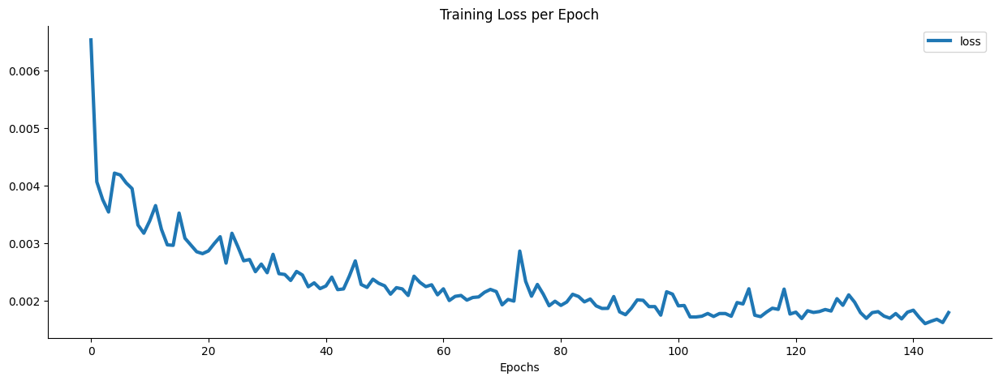

In [14]:
losses = pd.DataFrame(history.history)

plt.figure(figsize=(15,5))
sns.lineplot(data=losses,lw=3)
plt.xlabel('Epochs')
plt.ylabel('')
plt.title('Training Loss per Epoch')
sns.despine()

C:\Users\thoma\AppData\Local\Temp\ipykernel_12172\3274242667.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(errors, ax=axes[0])


[Text(0.5, 0, 'Test True Y'),
 Text(0, 0.5, 'Model Predictions'),
 Text(0.5, 1.0, 'Model Predictions vs Perfect Fit')]

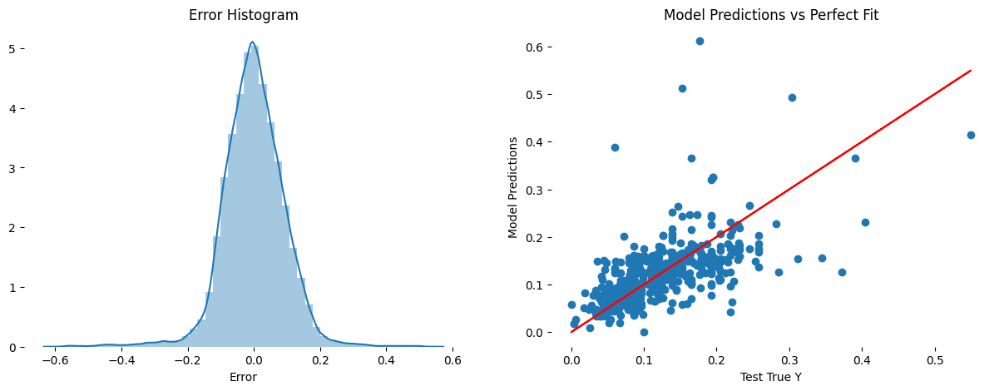

In [15]:
f, axes = plt.subplots(1, 2,figsize=(15,5))

# Our model predictions
plt.scatter(y_properties_test, predictions)

# Perfect predictions
plt.plot(y_properties_test, y_properties_test,'r')

errors = y_properties_test - predictions
sns.distplot(errors, ax=axes[0])

sns.despine(left=True, bottom=True)
axes[0].set(xlabel='Error', ylabel='', title='Error Histogram')
axes[1].set(xlabel='Test True Y', ylabel='Model Predictions', title='Model Predictions vs Perfect Fit')